<a href="https://colab.research.google.com/github/endnef2/big_leader/blob/main/DL/CNN_aug.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Pytorch CNN

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [23]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os

import torchvision
from torchvision import datasets, models
from torchvision import transforms

## 1. Data Processing

In [24]:
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import torch
from sklearn.model_selection import train_test_split

# Transforms에서 Data Augmentation, Tensor변환, Normalize 변환
data_transforms = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10), # 무작위로 10도 내외로 회전 (추가)
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1), # 색상 변화 (추가)
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# 전체 데이터셋 불러오기 (ok와 ng 폴더가 있는 경로)
data_path = '/content/drive/MyDrive/Colab Notebooks/DL/D4/chromate'
total_dataset = datasets.ImageFolder(root=data_path, transform=data_transforms)

# 현재 라벨 확인
print(total_dataset.class_to_idx) # {'ng': 0, 'ok': 1}와 같이 출력될 것입니다.

# 라벨 변경 (옵션)
total_dataset.class_to_idx = {'ok': 1, 'ng': 0} # 원하는 라벨로 변경

{'NG': 0, 'OK': 1}


In [36]:
len(total_dataset)

176

In [37]:
total_dataset[0]

(tensor([[[-2.0323, -2.0323, -2.0323,  ..., -2.0323, -2.0323, -2.0323],
          [-2.0323, -2.0323, -2.0323,  ..., -2.0323, -2.0323, -2.0323],
          [-2.0323, -2.0323, -2.0323,  ..., -2.0323, -2.0323, -2.0323],
          ...,
          [-2.0323, -2.0323, -2.0323,  ..., -2.0323, -2.0323, -2.0323],
          [-2.0323, -2.0323, -2.0323,  ..., -2.0323, -2.0323, -2.0323],
          [-2.0323, -2.0323, -2.0323,  ..., -2.0323, -2.0323, -2.0323]],
 
         [[-1.9482, -1.9482, -1.9482,  ..., -1.9482, -1.9482, -1.9482],
          [-1.9482, -1.9482, -1.9482,  ..., -1.9482, -1.9482, -1.9482],
          [-1.9482, -1.9482, -1.9482,  ..., -1.9482, -1.9482, -1.9482],
          ...,
          [-1.9482, -1.9482, -1.9482,  ..., -1.9482, -1.9482, -1.9482],
          [-1.9482, -1.9482, -1.9482,  ..., -1.9482, -1.9482, -1.9482],
          [-1.9482, -1.9482, -1.9482,  ..., -1.9482, -1.9482, -1.9482]],
 
         [[-1.7173, -1.7173, -1.7173,  ..., -1.7173, -1.7173, -1.7173],
          [-1.7173, -1.7173,

In [38]:
# 첫 번째 샘플의 이미지와 라벨
image, label = total_dataset[0]

In [40]:
# 이미지의 형태 (C, H, W)
print("image:", image.shape)
# 첫 번째 라벨
print("label:", label)

image: torch.Size([3, 224, 224])
label: 0


In [25]:
# 훈련 및 검증 세트로 분리
train_idx, val_idx = train_test_split(list(range(len(total_dataset))), test_size=0.2, random_state=42)
train_sampler = torch.utils.data.SubsetRandomSampler(train_idx)
val_sampler = torch.utils.data.SubsetRandomSampler(val_idx)

train_loader = torch.utils.data.DataLoader(
    total_dataset,
    batch_size=128,
    sampler=train_sampler,
    num_workers=4)

val_loader = torch.utils.data.DataLoader(
    total_dataset,
    batch_size=128,
    sampler=val_sampler,
    num_workers=4)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [26]:
train_loader

## 2. Model Design

## 2.1 ResNet18

In [6]:
# torchvision models에 저장되어 있음
model = models.resnet18(pretrained=True) # True : 이미 학습된 모델을 불러온다.
print()
print(model.fc)

num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, 2) # 두 개의 클래스에 대한 출력

print(model.fc)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 51.3MB/s]



Linear(in_features=512, out_features=1000, bias=True)
Linear(in_features=512, out_features=2, bias=True)


## 2.2 alexnet

In [27]:
from torchvision import models
import torch.nn as nn

model = models.alexnet(pretrained=True) # 이미 학습된 모델을 불러온다.

# 마지막 완전 연결 계층의 입력 특징 수
num_ftrs = model.classifier[6].in_features

# 두 개의 클래스에 대한 출력을 위한 선형 계층으로 교체
model.classifier[6] = nn.Linear(num_ftrs, 2)

print(model.classifier[6])

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Linear(in_features=4096, out_features=2, bias=True)


## 3. Training

In [28]:
from torch.optim.lr_scheduler import StepLR

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

model = model.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(),
                      lr=0.001,
                      momentum=0.9)

exp_lr_scheduler = StepLR(optimizer,
                          step_size=7,
                          gamma=0.1)

In [29]:
class EarlyStopping:
    """Early stops the training if validation loss doesn't improve after a given patience."""
    def __init__(self, patience=7, verbose=False, delta=0, path='checkpoint.pt', trace_func=print):
        """
        Args:
            patience (int): How long to wait after last time validation loss improved.
                            Default: 7
            verbose (bool): If True, prints a message for each validation loss improvement.
                            Default: False
            delta (float): Minimum change in the monitored quantity to qualify as an improvement.
                            Default: 0
            path (str): Path for the checkpoint to be saved to.
                            Default: 'checkpoint.pt'
            trace_func (function): trace print function.
                            Default: print
        """
        self.patience = patience
        self.verbose = verbose
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.val_loss_min = np.Inf
        self.delta = delta
        self.path = path
        self.trace_func = trace_func
    def __call__(self, val_loss, model):

        score = -val_loss

        if self.best_score is None:
            self.best_score = score
            self.save_checkpoint(val_loss, model)
        elif score < self.best_score + self.delta:
            self.counter += 1
            self.trace_func(f'EarlyStopping counter: {self.counter} out of {self.patience}')
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.save_checkpoint(val_loss, model)
            self.counter = 0

    def save_checkpoint(self, val_loss, model):
        '''Saves model when validation loss decrease.'''
        if self.verbose:
            self.trace_func(f'Validation loss decreased ({self.val_loss_min:.6f} --> {val_loss:.6f}).  Saving model ...')
        torch.save(model.state_dict(), self.path)
        self.val_loss_min = val_loss

In [30]:
# early_stopping 객체 선언(3번의 epoch 연속으로 loss 미개선 시에 조기 종료 예시)
es = EarlyStopping(patience = 3, verbose = True, delta=0.001, path='/content/drive/MyDrive/Colab Notebooks/DL/D4/chromate/chromate_alexnet.pt')

num_epochs=100

train_hist = []
val_hist = []
# 모델을 디바이스(GPU 또는 CPU)로 이동
model = model.to(device)

for epoch in range(num_epochs):
  # Train
  model.train()
  running_loss = 0.0
  running_corrects = 0

  for inputs, labels in train_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = model(inputs)
        _, preds = torch.max(outputs,1)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item()/inputs.size(0)
        running_corrects += \
        torch.sum(preds == labels.data)/inputs.size(0)

  exp_lr_scheduler.step()
  train_epoch_loss = running_loss / len(train_loader)
  train_epoch_acc = running_corrects / len(train_loader)


 # 훈련 손실 기록
  train_hist.append(train_epoch_loss)

 # Validation
  model.eval()
  running_loss = 0.0
  running_corrects = 0

  for inputs, labels in val_loader:
      inputs = inputs.to(device)
      labels = labels.to(device)
      outputs = model(inputs)
      _, preds = torch.max(outputs,1)
      loss = criterion(outputs, labels)

      running_loss += loss.item()/inputs.size(0)
      running_corrects += torch.sum(preds == labels.data)/inputs.size(0)



  epoch_loss = running_loss / len(val_loader)
  epoch_acc = running_corrects.double() / len(val_loader)

  # 검증 손실 기록
  val_hist.append(epoch_loss)

  es(-epoch_acc, model)
  if es.early_stop:
    print(epoch, loss.item())
    break
  print("Train: Loss: {:.4f} Acc: {:.4f}"
    " Val: Loss: {:.4f}"
    " Acc: {:.4f}".format(train_epoch_loss,
                         train_epoch_acc,
                         epoch_loss,
                         epoch_acc))

Validation loss decreased (inf --> -0.500000).  Saving model ...
Train: Loss: 0.0335 Acc: 0.5326 Val: Loss: 0.0235 Acc: 0.5000
Validation loss decreased (-0.500000 --> -0.638889).  Saving model ...
Train: Loss: 0.0198 Acc: 0.6719 Val: Loss: 0.0180 Acc: 0.6389
Validation loss decreased (-0.638889 --> -0.694444).  Saving model ...
Train: Loss: 0.0243 Acc: 0.7070 Val: Loss: 0.0152 Acc: 0.6944
Validation loss decreased (-0.694444 --> -0.722222).  Saving model ...
Train: Loss: 0.0218 Acc: 0.7682 Val: Loss: 0.0150 Acc: 0.7222
Validation loss decreased (-0.722222 --> -0.805556).  Saving model ...
Train: Loss: 0.0289 Acc: 0.7682 Val: Loss: 0.0136 Acc: 0.8056
Validation loss decreased (-0.805556 --> -0.861111).  Saving model ...
Train: Loss: 0.0183 Acc: 0.7422 Val: Loss: 0.0102 Acc: 0.8611
EarlyStopping counter: 1 out of 3
Train: Loss: 0.0285 Acc: 0.7005 Val: Loss: 0.0096 Acc: 0.8333
Validation loss decreased (-0.861111 --> -0.888889).  Saving model ...
Train: Loss: 0.0175 Acc: 0.8529 Val: Loss

## 4. Testing and Deployment

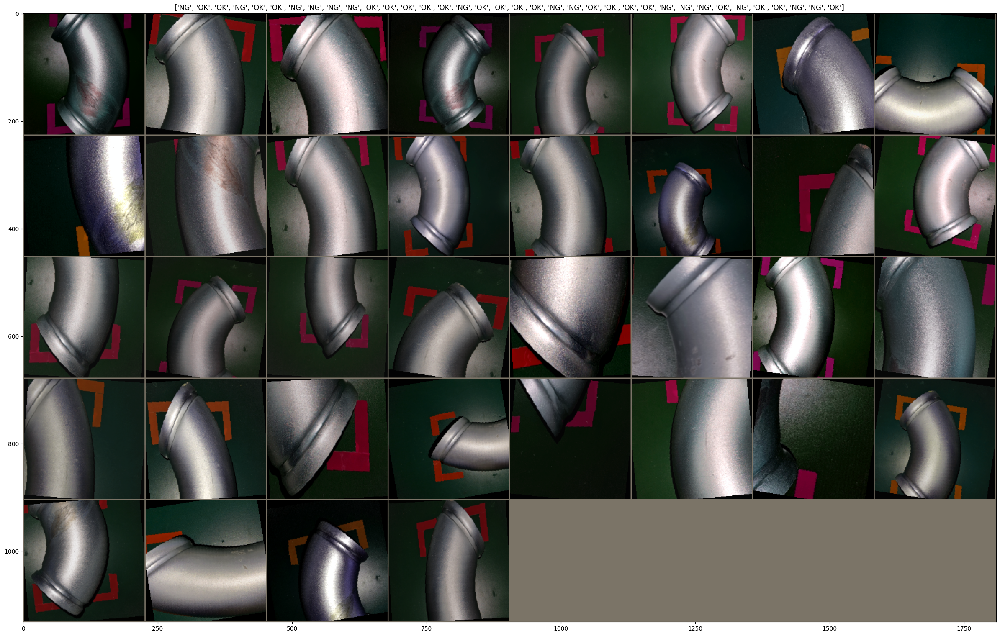

In [31]:
import matplotlib.pyplot as plt

def imshow(inp, title=None):
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)

    plt.figure(figsize=[30, 30])
    plt.imshow(inp)
    if title is not None:
        plt.title(title)

inputs, classes = next(iter(val_loader))
out = torchvision.utils.make_grid(inputs)
class_names = total_dataset.classes

outputs = model(inputs.to(device))
_, preds = torch.max(outputs,1)

imshow(out, title=[class_names[x] for x in preds])

## 5. Classification Report

In [32]:
from sklearn.metrics import classification_report

# 예측 및 실제 라벨 수집
all_preds = []
all_labels = []

with torch.no_grad():
    for inputs, labels in val_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# 분류 보고서 출력
report = classification_report(all_labels, all_preds, target_names=class_names)
print(report)

              precision    recall  f1-score   support

          NG       0.92      0.67      0.77        18
          OK       0.74      0.94      0.83        18

    accuracy                           0.81        36
   macro avg       0.83      0.81      0.80        36
weighted avg       0.83      0.81      0.80        36



/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


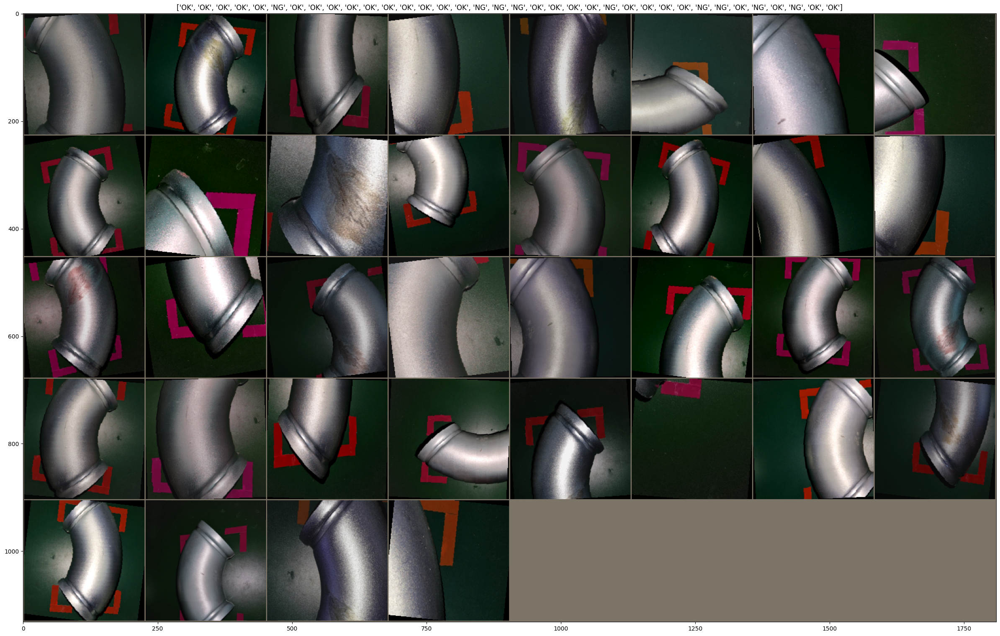

In [33]:
inputs, classes = next(iter(val_loader))
out = torchvision.utils.make_grid(inputs)

outputs = model(inputs.to(device))
_, preds = torch.max(outputs, 1)

imshow(out, title=[class_names[x] for x in preds])

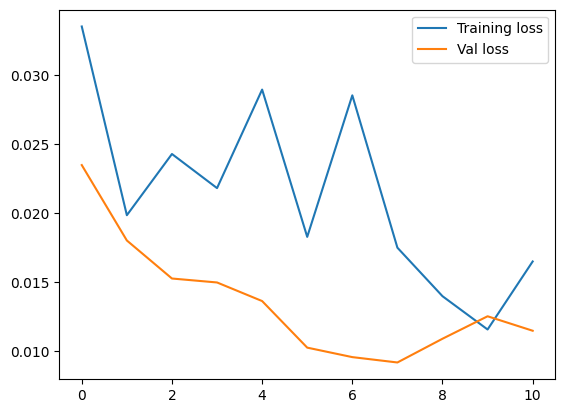

In [34]:
plt.plot(train_hist, label="Training loss")
plt.plot(val_hist, label="Val loss")
plt.legend()